In [161]:
COLAB = False
PARRALLEL_COMPUTING = True
RANDOM_SEED = 42

if COLAB:
  from google.colab import drive
  drive.mount('/content/drive')
  ROOT_DIR = '/content/drive/MyDrive/data/DMBD'

  from google.colab import data_table
  data_table.enable_dataframe_formatter()

else:
  ROOT_DIR = '.'

# Task 2

Study the evolution of bitcoin communities according to the bitcoin values, from 01/01/2015 to 01/06/2017.

## Import

In [162]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import TimeSeriesSplit, train_test_split, GridSearchCV
import os
from tqdm import tqdm
from community import community_louvain
import matplotlib.pyplot as plt
import networkx as nx
import os
import pandas as pd
import pickle

from concurrent.futures import ThreadPoolExecutor, ProcessPoolExecutor
from datetime import datetime
from tqdm import tqdm

In [ ]:
!pip install teneto

In [8]:
import teneto
from teneto import TemporalNetwork

d:\DSC\DMBD\projet\.venv\lib\site-packages\nilearn\input_data\__init__.py:23: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


In [3]:
tqdm.pandas(desc="Computing ...")

In [ ]:
!pip install cdlib

In [11]:
!pip install igraph


[notice] A new release of pip is available: 23.0.1 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [12]:
!pip install leidenalg


[notice] A new release of pip is available: 23.0.1 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip


## Load data

### Bitcoin transactions

First in order to load the collection we collect the files names

In [4]:
daily_bitcoin_files = [f for f in os.listdir(f'{ROOT_DIR}/networks')]
daily_bitcoin_files[:5]

['2015-1-1.csv',
 '2015-1-10.csv',
 '2015-1-11.csv',
 '2015-1-12.csv',
 '2015-1-13.csv']

Second, we load each file into a dataframe.  
And since the date is in the file name, we extract it and add it as a column to the dataframe.

In [5]:
def load_daily_bitcoin_transactions_file(filename):
  return pd.read_csv(f'{ROOT_DIR}/networks/{filename}'
  ).assign(
      Date=datetime.strptime(filename.split('.')[0], "%Y-%m-%d")
  )

In [6]:
if PARRALLEL_COMPUTING :
  with ThreadPoolExecutor() as executor:
    daily_bitcoin_transactions = list(
        tqdm(
            executor.map(load_daily_bitcoin_transactions_file, daily_bitcoin_files),
            total=len(daily_bitcoin_files),
            desc="Loading files in parrallel ..."
        )
    )
else:
  daily_bitcoin_transaction = [
      load_daily_bitcoin_transactions_file(file)
      for file in tqdm(daily_bicoin_files, "Loading files ...")
      ]

Loading files in parrallel ...:   0%|          | 0/912 [00:00<?, ?it/s]

Loading files in parrallel ...: 100%|██████████| 912/912 [00:05<00:00, 158.78it/s]


Finally, we concatenate all the dataframes into one.  

In [7]:
transaction_network_df = pd.concat(daily_bitcoin_transactions)

### Bitcoin values

Since we want to study the evolution of bitcoin communities according to the bitcoin values, we need to load the bitcoin values.  
For this we use the [data on this site](https://www.in2013dollars.com/bitcoin-price) that we converted on a csv file availible on [kaggle](https://www.kaggle.com/datasets/williammaillard/bitcoin-value-monthly-evolution/download?datasetVersionNumber=1).  
Then we load it into a dataframe.

In [17]:
!pip install -q opendatasets


[notice] A new release of pip is available: 23.0.1 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [18]:
import opendatasets as od

bitcoin_dataset_name = 'bitcoin-value-monthly-evolution'

od.download(
    'https://www.kaggle.com/datasets/williammaillard/bitcoin-value-monthly-evolution',
    data_dir=ROOT_DIR)

Skipping, found downloaded files in ".\bitcoin-value-monthly-evolution" (use force=True to force download)


In [13]:
bitcoin_value_df = pd.read_csv(f'{ROOT_DIR}/bitcoin-value-monthly-evolution/bitcoin_months_values.csv')

In [14]:
bitcoin_value_df.rename(columns={'Bitcoin Price ($)' : 'value'})


,Year,Month,value,Change ($),Month-over-month (%)
0,2017,6,2407.88,986.28,69.38
1,2017,5,1421.60,341.10,31.57
2,2017,4,1080.50,-142.00,-11.62
3,2017,3,1222.50,233.48,23.61
4,2017,2,989.02,-9.30,-0.93
5,2017,1,998.33,241.55,31.92
6,2016,12,756.77,26.98,3.70
7,2016,11,729.79,115.81,18.86
8,2016,10,613.98,41.68,7.28
9,2016,9,572.30,-33.97,-5.60


In [15]:
def create_year_month_period(row):
    return pd.Period(f'{int(row.Year)}-{int(row.Month)}', freq='M')

In [16]:
bitcoin_value_df['Date'] = bitcoin_value_df.progress_apply(create_year_month_period, axis=1)

Computing ...: 100%|██████████| 30/30 [00:00<00:00, 1455.23it/s]


In [17]:
del bitcoin_value_df['Year']
del bitcoin_value_df['Month']
bitcoin_value_df = bitcoin_value_df.set_index('Date')
bitcoin_value_df.head()

,Bitcoin Price ($),Change ($),Month-over-month (%)
Date,,,
2017-06,2407.88,986.28,69.38
2017-05,1421.60,341.10,31.57
2017-04,1080.50,-142.00,-11.62
2017-03,1222.50,233.48,23.61
2017-02,989.02,-9.30,-0.93


In [18]:
bitcoin_value_df.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 30 entries, 2017-06 to 2015-01
Freq: M
Data columns (total 3 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Bitcoin Price ($)     30 non-null     float64
 1   Change ($)            30 non-null     float64
 2   Month-over-month (%)  30 non-null     float64
dtypes: float64(3)
memory usage: 960.0 bytes


## Data cleaning

In [19]:
len(daily_bitcoin_transactions)

912

We have 912 files ce qui correspond à notre interval de 2 ans et demi (365*2,5 ~ 912), on n'a donc pas de jours manquant.  
Regardons les données contenus dans nos dataframe pour avoir une idée du preprocess à réaliser.

In [20]:
transaction_network_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5876734 entries, 0 to 5654
Data columns (total 5 columns):
 #   Column           Dtype         
---  ------           -----         
 0   Source           object        
 1   Target           object        
 2   value            int64         
 3   nb_transactions  int64         
 4   Date             datetime64[us]
dtypes: datetime64[us](1), int64(2), object(2)
memory usage: 269.0+ MB


In [21]:
transaction_network_df.head()

,Source,Target,value,nb_transactions,Date
0,ePay.info_CoinJoinMess,CloudBet.com,3519173,1,2015-01-01
1,Cex.io,1956,8491196,3,2015-01-01
2,157228,C-Cex.com,10833480021,1,2015-01-01
3,0,421,27123449,8,2015-01-01
4,BTCGuild.com,787953,2507884460,1,2015-01-01


In [22]:
summary_df = transaction_network_df.describe(exclude="datetime64")
summary_df

,Source,Target,value,nb_transactions
count,5876734,5876734,5.876734e+06,5.876734e+06
unique,9915,9815,NaN,NaN
top,ePay.info_CoinJoinMess,0,NaN,NaN
freq,232016,148081,NaN,NaN
mean,NaN,NaN,4.959313e+10,6.409414e+00
std,NaN,NaN,1.117547e+12,7.640905e+01
min,NaN,NaN,1.100000e+01,1.000000e+00
25%,NaN,NaN,1.758358e+07,1.000000e+00
50%,NaN,NaN,1.183139e+08,1.000000e+00
75%,NaN,NaN,1.000000e+09,2.000000e+00


The first thing we can notice is that the source and target column are of type object, which is not optimal for graph library used later, and also because they contain different types such as int64 and str.  
Thus we will need a reversible function to convert them to int64.  

On the other hand, two columns (value and nb_transaction) could be suse as the weight of the edges. Since we want to find communities among those data we decided that considering the number of transaction is more relevant than the value.  
Nethertheless, we will keep the value column that might be used for computing statistics of communities later.  

### Convert source and target to int64

In [23]:
vectorized_column_name = ['Source', 'Target']

In [24]:
class ColumnVectorizer():

    def __init__(self, df, col_names):
        self.df = df
        self.col_names = col_names
        self.vectorizer = {}
        self.reverse_vectorizer = {}
        self.create_column_vectorizer()


    def create_column_vectorizer(self) -> tuple[dict, dict]:
        """
        Vectorize the content of the columns name of the dataframe given.
        If multiple column are given that means that their content in linked somehow and
        will be treated in consequence.
        """
        # 1. Collect all the values of the columns
        col_values = []
        for c in self.col_names:
            col_values += self.df[c].astype(str).tolist()

        # 2. Delete duplicated entries
        k=0

        for i in col_values:
            if i not in self.vectorizer:
                self.vectorizer[i] = k
                self.reverse_vectorizer[k] = i
                k += 1

    def _vectorize(self, x:any) -> int:
        return self.vectorizer[x]


    def _reverse_vectorize(self, x:int) -> any:
        return self.reverse_vectorizer[x]

    def vectorize(self) -> pd.DataFrame:
        for c in self.col_names:
            self.df[c] = self.df[c].progress_apply(self._vectorize)
        return self.df

    def reverse_vectorize(self) -> pd.DataFrame:
        for c in self.col_names:
            self.df[c] = self.df[c].progress_apply(self._reverse_vectorize)
        return self.df

In [25]:

vectorizer = ColumnVectorizer(transaction_network_df, vectorized_column_name)

In [26]:
transaction_network_df = vectorizer.vectorize()

Computing ...: 100%|██████████| 5876734/5876734 [00:06<00:00, 970828.25it/s] 


In [27]:
transaction_network_df.head()

,Source,Target,value,nb_transactions,Date
0,0,1178,3519173,1,2015-01-01
1,1,20,8491196,3,2015-01-01
2,2,46,10833480021,1,2015-01-01
3,3,91,27123449,8,2015-01-01
4,4,1207,2507884460,1,2015-01-01


In [28]:
transaction_network_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5876734 entries, 0 to 5654
Data columns (total 5 columns):
 #   Column           Dtype         
---  ------           -----         
 0   Source           int64         
 1   Target           int64         
 2   value            int64         
 3   nb_transactions  int64         
 4   Date             datetime64[us]
dtypes: datetime64[us](1), int64(4)
memory usage: 269.0 MB


### Missing values

We check if there is any missing value in the dataset that can noice the results.

In [36]:
missing_values = transaction_network_df.isnull().sum()
missing_values

Source             0
Target             0
value              0
nb_transactions    0
Date               0
dtype: int64

In [37]:
missing_values = transaction_network_df.isna().sum()
missing_values

Source             0
Target             0
value              0
nb_transactions    0
Date               0
dtype: int64

So there is no missing value in the dataset. We have done with the data cleaning stage.

## Data preprocessing

Finally, after some test to create temporal graph with teneto with a snapshot for each days we realize that the amount of memory needed was too big. Therefor we decided to concatenante the data by months in order to reduce this amount.  
For that we do a group and then apply an agregate function which is kind of an equivalent of a reduceByKey for pandas.

### Drop days information

In [29]:
transaction_network_df['Date'] = transaction_network_df['Date'].dt.to_period('M')

In [30]:
transaction_network_df.head()

,Source,Target,value,nb_transactions,Date
0,0,1178,3519173,1,2015-01
1,1,20,8491196,3,2015-01
2,2,46,10833480021,1,2015-01
3,3,91,27123449,8,2015-01
4,4,1207,2507884460,1,2015-01


### Agregate by month

In [31]:
tn_month_df = transaction_network_df.groupby(['Date', 'Source', 'Target']).sum()
tn_month_df = tn_month_df.reset_index()

In [32]:
tn_month_df.head()

,Date,Source,Target,value,nb_transactions
0,2015-01,0,1,104086696390356,4471
1,2015-01,0,3,153489412416368,15712
2,2015-01,0,5,1777376845,32
3,2015-01,0,6,12773669220604,735
4,2015-01,0,9,3121532603463,353


In [33]:
i = pd.Period('2015-04', freq='M')
tn_month_df[ tn_month_df['Date'] == i].head()

,Date,Source,Target,value,nb_transactions
66775,2015-04,0,1,97539308958386,5912
66776,2015-04,0,3,296039174861697,35978
66777,2015-04,0,4,372469343,2
66778,2015-04,0,5,11180350564,107
66779,2015-04,0,6,22438499535292,1643


In [34]:
print(f'Size before: {transaction_network_df.shape}')
print(f'Size after: {tn_month_df.shape}')
print(f'Difference: {transaction_network_df.shape[0] - tn_month_df.shape[0]}')

Size before: (5876734, 5)
Size after: (1458427, 5)
Difference: 4418307


We can notice that we have drasticly reduce the amount of data.  
It also important to notice that reducing the time slice will also improve the tracking of the community over time beacuase it's specify in the subject that the files contains the more active actors of the day. Therefore some transactions might be missing, that could lead to some community to disapear for one day and reapear the next one.  
That is less likely to happend we a month interval (i.e false death of a community).

# Temporal graph with networkx

Networkx doesn't have a data structure for temporal graph.  
Therefor we need to store each snapshot in a dictionnary with the Date as key.  
We can then compute the community the first snapshot and then using a similarity measure, in our case the Jaccard similarity, to track the communities life events listed in this [paper]( https://arxiv.org/ftp/arxiv/papers/1207/1207.4297.pdf):

- Continuation: the community is still active
- Split: the community is divided into two or more communities
- Merge: two or more communities are merged into one
- Birth: a new community is created
- Death: a community disappears
- shrink: a community loses some of its members but continues to exist
- grow: a community gains new members but continues to exist

### Build the graph dictionary

From the preprocessed dataframe we build a dictionnary of graph with the date as key and the graph as value.  

In [35]:
def create_dict_of_graphs(df:pd.DataFrame) -> dict:
    """
    Create a dictionnary of graphs where the key is the date and the value is the graph
    """
    graphs = {}
    for i in tqdm(df['Date'].unique(), desc="Creating graphs ..."):
        graphs[i] = nx.from_pandas_edgelist(
            df[df['Date'] == i],
            source='Source',
            target='Target',
            edge_attr=['value', 'nb_transactions'],
            create_using=nx.DiGraph
        )
    return graphs

In [36]:
monthly_graphs = create_dict_of_graphs(tn_month_df)

Creating graphs ...:   7%|▋         | 2/30 [00:00<00:01, 14.32it/s]

Creating graphs ...: 100%|██████████| 30/30 [00:05<00:00,  5.89it/s]


Let's see how the graph looks like for the first snapshot.

In [46]:
# i = pd.Period('2015-01', freq='M')

# plt.figure(figsize=(25, 50))
# nx.draw(monthly_graphs[i], with_labels=True)
# plt.show()

The graph take approximately 2m to be computed.  
On this graph we can see see in the center some strongly related nodes that form communities and on the periphery some nodes that might form a community on their own except for some nodes that are strongly related to the center.  
Therefor with chose the louvain algorithm to compute community due to its computation in O(n log n).

In [37]:
def plot_graph_evolution(graphs:dict, title:str, y_label:str, x_label:str, figsize:tuple=(15, 5)):
    """
    Plot the evolution of a graph over time
    """
    x = []
    y = []
    for i in graphs.keys():
        x.append(i.to_timestamp(freq="M"))
        y.append(graphs[i].number_of_nodes())

    plt.figure(figsize=figsize)
    plt.plot(x, y)
    plt.title(title)
    plt.ylabel(y_label)
    plt.xlabel(x_label)
    plt.show()

In [38]:
# plot evolution of number of edges over time
def plot_edge_evolution(graphs:dict, title:str, y_label:str, x_label:str, figsize:tuple=(15, 5)):
    """
    Plot the evolution of a graph over time
    """
    x = []
    y = []
    for i in graphs.keys():
        x.append(i.to_timestamp(freq="M"))
        y.append(graphs[i].number_of_edges())

    plt.figure(figsize=figsize)
    plt.plot(x, y)
    plt.title(title)
    plt.ylabel(y_label)
    plt.xlabel(x_label)
    plt.show()

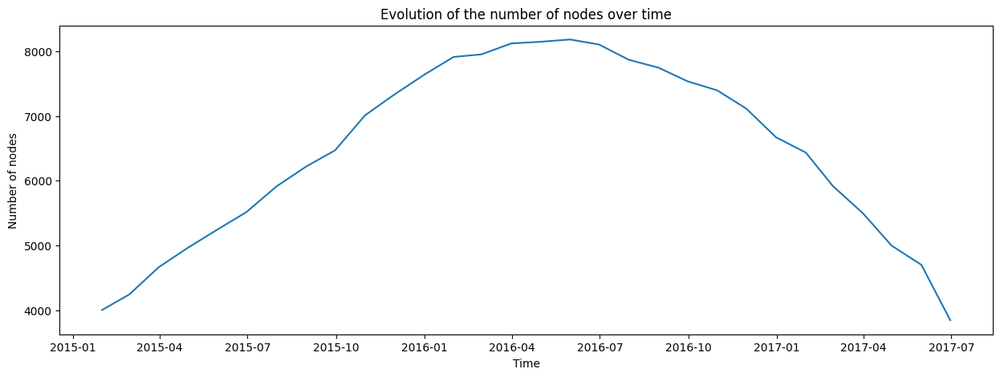

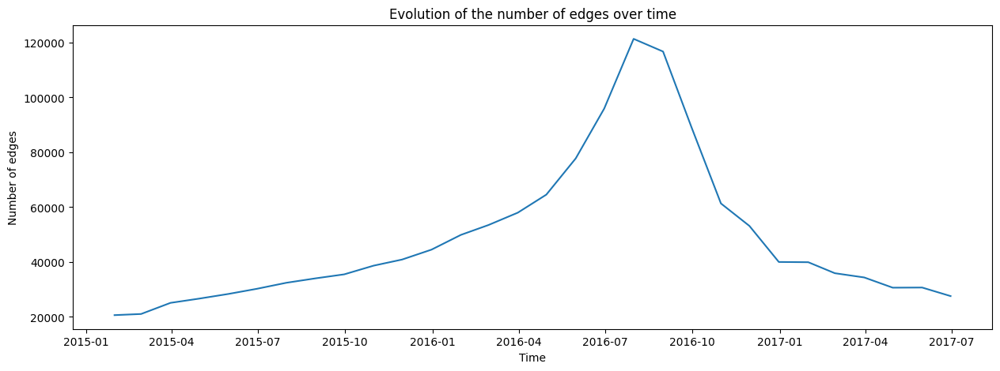

In [49]:
plot_graph_evolution(monthly_graphs, "Evolution of the number of nodes over time", "Number of nodes", "Time")
plot_edge_evolution(monthly_graphs, "Evolution of the number of edges over time", "Number of edges", "Time")

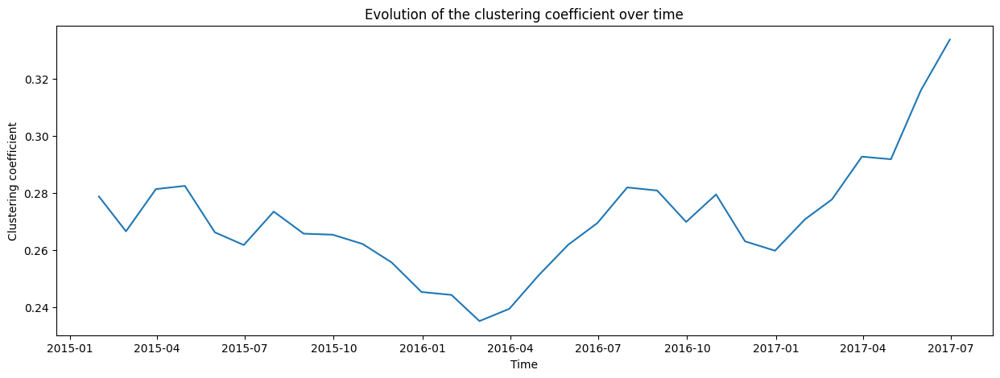

In [50]:
def plot_clustering_coefficient_evolution(graphs:dict, title:str, y_label:str, x_label:str, figsize:tuple=(15, 5)):
    """
    Plot the evolution of a graph over time
    """
    x = []
    y = []
    for i in graphs.keys():
        x.append(i.to_timestamp(freq="M"))
        y.append(nx.average_clustering(graphs[i]))

    plt.figure(figsize=figsize)
    plt.plot(x, y)
    plt.title(title)
    plt.ylabel(y_label)
    plt.xlabel(x_label)
    plt.show()

plot_clustering_coefficient_evolution(monthly_graphs, "Evolution of the clustering coefficient over time", "Clustering coefficient", "Time")

### Community computation

In [39]:
community_evolution = {}
community_save_path = f'{ROOT_DIR}/save/louvain_community_evolution_dict.pkl'

In [70]:
def create_community(args):
  date, graph = args
  return (date, nx.algorithms.community.louvain.louvain_communities(graph, seed=RANDOM_SEED))
# greedy_modularity_communities

In [164]:
if PARRALLEL_COMPUTING:
  with ThreadPoolExecutor() as executor:
    result = list(tqdm(
        executor.map(create_community, monthly_graphs.items()),
        total=len(monthly_graphs),
        desc="Computing Communities in parrallel ..."
    ))

  community_evolution = {
      date : graph
      for date, graph in result
  }

else:
  for date, graph in monthly_graphs.items():
    community_evolution[date] = create_community((date,graph))[1]
    print(f'Community for {date} computed, size : {len(community_evolution[date])}')

with open(community_save_path, 'wb') as file:
    pickle.dump(community_evolution, file)

Community for 2015-01 computed, size : 18
Community for 2015-02 computed, size : 27
Community for 2015-03 computed, size : 17
Community for 2015-04 computed, size : 25
Community for 2015-05 computed, size : 15
Community for 2015-06 computed, size : 23
Community for 2015-07 computed, size : 22
Community for 2015-08 computed, size : 23
Community for 2015-09 computed, size : 26
Community for 2015-10 computed, size : 24
Community for 2015-11 computed, size : 31
Community for 2015-12 computed, size : 22
Community for 2016-01 computed, size : 28
Community for 2016-02 computed, size : 28
Community for 2016-03 computed, size : 26
Community for 2016-04 computed, size : 25
Community for 2016-05 computed, size : 17
Community for 2016-06 computed, size : 29
Community for 2016-07 computed, size : 24
Community for 2016-08 computed, size : 13
Community for 2016-09 computed, size : 31
Community for 2016-10 computed, size : 26
Community for 2016-11 computed, size : 22
Community for 2016-12 computed, si

In [165]:
with open(community_save_path, 'rb') as file:
  community_evolution = pickle.load(file)

In [43]:
community_evolution = {}

with open(community_save_path, 'rb') as file:
    community_evolution = pickle.load(file)

In [166]:
len(community_evolution)

30

In [175]:
# check the number of communities foud for time t=2015-01
len(list(community_evolution.items())[0][1])

18

Compute the evolution of the number of community over time.

In [44]:
def get_community_size(community_dict:dict) -> dict:
  """
  Return a dict where the key is the date and the value is the size of the community
  """
  community_size = {}
  for date, community in community_dict.items():
    community_size[date] = len(community)
  return community_size

In [45]:
community_size_df = pd.DataFrame.from_dict(
  get_community_size(community_evolution),
  orient='index', columns=['Community Size'])

Plot number of communities evolution and bitcoin value evolution on the same graph.

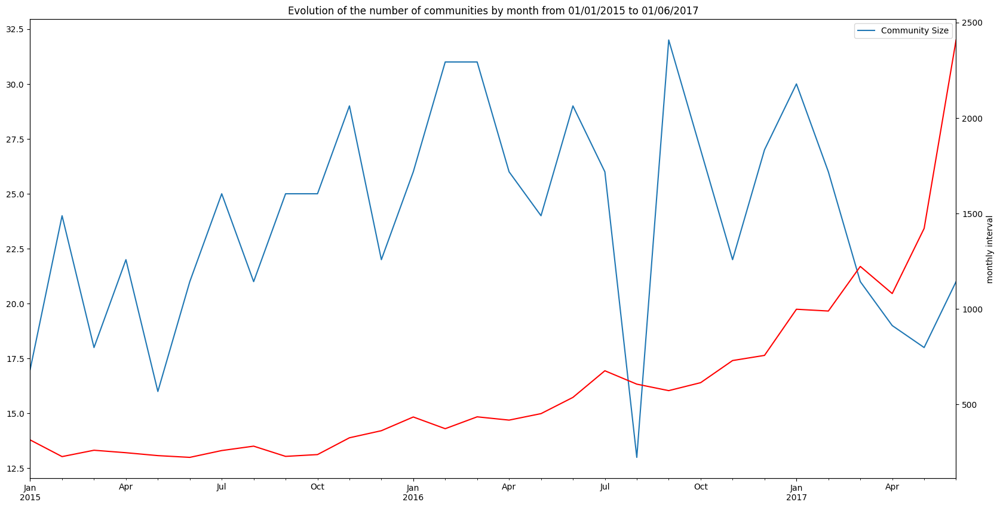

In [58]:
ax1 = community_size_df.plot(figsize=(20, 10))
ax2 = ax1.twinx()
bitcoin_value_df['value'].plot(ax=ax2, color='red')
#ax2.plot(bitcoin_value_df['Date'], bitcoin_value_df['value'], color='red')
plt.xlabel('Number of communities')
plt.ylabel('monthly interval')
plt.title('Evolution of the number of communities by month from 01/01/2015 to 01/06/2017')
plt.show()

The number of community doesnt seem to be correlated with the bitcoin value.

### Community tracking

In order to track the community over time we need to compute the similarity between each snapshot.  
For that we chose to use a Jaccard similarity measure for its simplicity and efficiency to compare two sets.  
Then based on similarity computed and meta-data of snapshot at time t and t+1 we can compute the life event of each community.

#### similarity function

In [46]:
jaccard = lambda x, y: len(set(x) & set(y)) / len(set(x) | set(y))

#### Definition of Classes

In [47]:
from enum import Enum

class EventTypeEnum(Enum):
  FORMING = 1
  DISOLVING = -1
  CONTINUING = 0
  SHRINKING = -2
  GROWING = 2
  SPLITTING = 3
  MERGING = -3

In [97]:
class EventTime():

  def __init__(self, event_type, nb_members):
    self.event_type = event_type
    self.nb_members = nb_members

In [210]:
class TemporalCommunity():
    """Here we define a classes to track the evolution of found communities over time:"""
    def __init__(self, members, date, event_type=None):
        self.current_members = members
        self.current_date = date
        self.life_event_ = {
            date : EventTime(EventTypeEnum.FORMING, len(members)) if not event_type else event_type
        }

    def update(self, members, date, event_type):
        self.current_members = members
        self.current_date = date
        self.life_event_[date] = event_type

    def __len__(self):
        return len(self.current_members)

    def __str__(self):
        return f'current state : {self.current_date} : {len(self)}'

#### Community evolution

Here the idea to follow communities other time :  
Pandas.DataFrame :  
Ti | Ci | Tj | Cj | Score |  

===========================  

At time Tj match each communauty Cj with Ci community at time Ti=Tj-1,  
with the higher score (jaccar similarity) with a tolerance of 2%.  

===== 7 cases (innequality with error marging noted [n%])=====    

- If len(Cj) >[5%] len(Ci):  
	Then event for community Ci at time Tj is Growing  

- If len(Cj <[5%] len(Ci):  
	Then event community Ci at time Tj is Shrinking  

- If len(Cj =[2%] len(Ci):
	Then the event community Ci at time Tj is Continuing  

- If Ci already match an over community:  
	Then the event community Ci at time Tj is Splitting  
	and Cj with over matching communities are Forming  

- If Cj match with multiple community:  
	Then the envent community Ci1, Ci2, ... matching Cj at time Tj is Merging  
	and Cj is Forming  
- If a community Cj didn't match any Ci:  
	Then Cj is Forming  

- If a community Ci dindn't match any Cj:  
	Then the event community Ci at time Tj is Disolving  


##### Compute similarity and create dataframe

In [51]:
from itertools import product
from cdlib import algorithms

Note: to be able to use all crisp methods, you need to install some additional packages:  {'infomap', 'bayanpy', 'graph_tool', 'wurlitzer'}
Note: to be able to use all crisp methods, you need to install some additional packages:  {'pyclustering', 'ASLPAw'}
Note: to be able to use all crisp methods, you need to install some additional packages:  {'infomap', 'wurlitzer'}


In [209]:
temporal_communities = []
temporal_communities_inactive = []

In [206]:
# initialisation
list_communities = list(community_evolution.items())
list_communities.sort(key=lambda x: x[0])
coms = []

In [216]:
# add communities at time t=2015-01
date_i, communities_i = list_communities.pop(0) # remove communities of 2015-01 already added
for com in tqdm(communities_i, desc="Creating Temporal Communities forming at 2015-01 ..."):
  temporal_communities.append(TemporalCommunity(com, date_i))

Creating Temporal Communities forming at 2015-01 ...: 100%|██████████| 27/27 [00:00<?, ?it/s]


In [221]:
# Compute similarity between existing communities and communities at time j
for date_j, communities_j in tqdm(list_communities, desc="Computing Jaccard Similarity ..."):
    id_com_i = list(enumerate(temporal_communities))
    ni = len(temporal_communities)
    id_com_j = list(enumerate(communities_j))
    nj = len(communities_j)
    similarity_matrix = np.full((ni, nj), -1, dtype=int)

    # 1. Compute similarity scores
    for j, com_j in id_com_j:
        for i, com in id_com_i:
            similarity_matrix[i][j] = jaccard(com.current_members, com_j)


    # Compute the tuple (ci, cj) with the best score
    similarity_list = []
    for cj in range(nj):
        ci = np.argmax(similarity_matrix[:, cj])
        similarity_list.append((ci, cj))


    # 3. Is there a change in communities number ?
    n_i = len(temporal_communities)
    n_j = len(communities_j)

    k = n_i - n_j

    # 3.1 Yes, there is more communities => Creation or split ?
    if k != 0:
        # Find Cj that match the same Ci
        similarity_list.sort(key=lambda x: x[0])
        # Handle split and merge ...
        # ci, cj = similarity_list[0]
        # k = 1
        # n = len(similarity_list)
        # last_event = None

        # while k < n:
        #     ci_1, cj_1 = similarity_list[k]

        #     if ci == ci_1 or last_event == EventTypeEnum.SPLITTING:
        #         event = EventTypeEnum.SPLITTING
        #         # create a new community from a split
        #         temporal_communities.append(
        #             TemporalCommunity(
        #                 communities_j[cj], date_j,
        #                 EventTime(event, len(communities_j[cj_1]))
        #                 )
        #             )
        #         last_event = event
        #     else:
        # Creation of k communities
        for i in range(len(similarity_list)):
            if i < abs(k):
                # update community
                ci, cj = similarity_list[i]
                nb_members_cj = len(communities_j[cj])
                nb_members_ci = len(temporal_communities[ci])

                if nb_members_ci > nb_members_cj:
                    event = EventTypeEnum.GROWING
                elif nb_members_ci < nb_members_cj:
                    event = EventTypeEnum.SHRINKING
                else:
                    event = EventTypeEnum.CONTINUING

                temporal_communities[ci].update(
                    communities_j[cj], date_j,
                    EventTime(event, nb_members_cj)
                    )
            else:
                if k < 0:
                    event = EventTypeEnum.DISOLVING
                    temporal_communities[ci].update(communities_j[cj], date_j, event)
                    temporal_communities_inactive.append(temporal_communities.pop(ci))
                else:
                    event = EventTypeEnum.FORMING
                    temporal_communities.append(TemporalCommunity(communities_j[cj], date_j, event))

    else:
        for i in range(len(similarity_list)):
            # update community
            ci, cj = similarity_list[i]
            nb_members_cj = len(communities_j[cj])
            nb_members_ci = len(temporal_communities[ci])

            if nb_members_ci > nb_members_cj:
                event = EventTypeEnum.GROWING
            elif nb_members_ci < nb_members_cj:
                event = EventTypeEnum.SHRINKING
            else:
                event = EventTypeEnum.CONTINUING

            temporal_communities[ci].update(
                communities_j[cj], date_j,
                EventTime(event, nb_members_cj)
            )


Computing Jaccard Similarity ...: 100%|██████████| 28/28 [00:01<00:00, 23.02it/s]


In [223]:
len(temporal_communities)

62

In [224]:
len(temporal_communities_inactive)

0

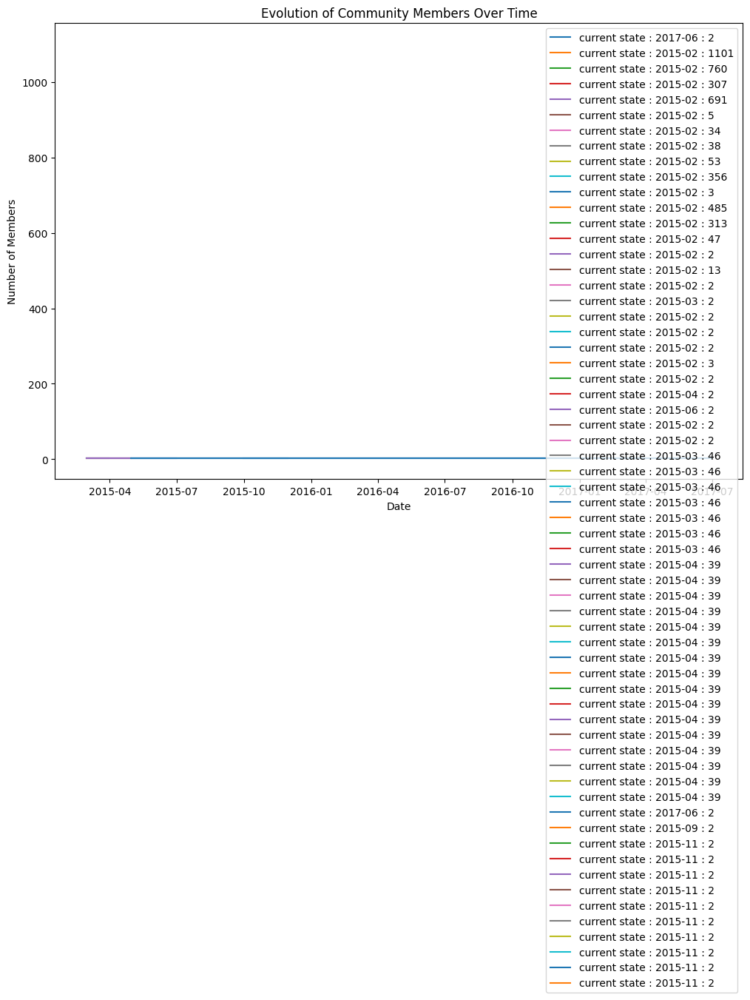

AttributeError: 'EventTypeEnum' object has no attribute 'event_type'

In [227]:
import seaborn as sns

# Assuming temporal_communities is a list of TemporalCommunity instances
# You may need to adapt this based on how your data is structured

# Plotting the evolution of members
fig, ax = plt.subplots(figsize=(12, 8))

for community in temporal_communities:
    # Extracting dates and corresponding member counts
    dates = list(community.life_event_.keys())
    dates = [date.to_timestamp(freq='M') for date in dates]
    member_counts = [len(community) for date, event_time in community.life_event_.items()]

    # Plotting the evolution of members for each community
    ax.plot(dates, member_counts, label=str(community))

ax.set_xlabel('Date')
ax.set_ylabel('Number of Members')
ax.set_title('Evolution of Community Members Over Time')
ax.legend()
plt.show()

# Counting the number of events by date
event_counts = {
    date: {
        EventTypeEnum(event_time.event_type): event_time.nb_members
        for date, event_time in community.life_event_.items()
    }
    for community in temporal_communities
}

# Creating a DataFrame for event counts
event_df = pd.DataFrame.from_dict(event_counts, orient='index')

# Plotting a bar plot for event counts
fig, ax = plt.subplots(figsize=(12, 8))
sns.barplot(x=event_df.index, y='FORMING', data=event_df, ax=ax, label='FORMING', color='blue')
sns.barplot(x=event_df.index, y='GROWING', data=event_df, ax=ax, label='GROWING', color='green')
sns.barplot(x=event_df.index, y='SHRINKING', data=event_df, ax=ax, label='SHRINKING', color='red')

ax.set_xlabel('Date')
ax.set_ylabel('Number of Events')
ax.set_title('Number of Events by Date')
ax.legend()
plt.show()


In [222]:
communities_df = pd.DataFrame(coms, columns=['Ti', 'Ci', 'Tj', 'Cj', 'Score'])

In [ ]:
communities_df.head(50)

In [147]:
communities_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 683 entries, 0 to 682
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype    
---  ------  --------------  -----    
 0   Ti      683 non-null    period[M]
 1   Ci      683 non-null    object   
 2   Tj      683 non-null    period[M]
 3   Cj      683 non-null    object   
 4   Score   683 non-null    float64  
dtypes: float64(1), object(2), period[M](2)
memory usage: 26.8+ KB


##### Community event processing functions

In [100]:
def determine_event(row_current, row_prev):
    """
    Determine the event type based on the conditions.

    Parameters:
    - row_current: Current row in the DataFrame.
    - row_prev: Previous row in the DataFrame.

    Returns:
    - event: String representing the event type.
    """
    if len(row_current['Cj']) > 1.05 * len(row_prev['Ci']):
        return 'Growing'
    elif len(row_current['Cj']) < 0.95 * len(row_prev['Ci']):
        return 'Shrinking'
    elif len(row_current['Cj']) >= 0.98 * len(row_prev['Ci']):
        return 'Continuing'
    elif len(row_current['Ci']) > 0:
        return 'Splitting'
    elif len(row_current['Cj']) > 1:
        return 'Merging'
    else:
        return 'Forming'

In [101]:
def process_events_and_evolutions(df):
    """
    Process events and evolutions from the DataFrame.

    Parameters:
    - df: Pandas DataFrame containing Ti, Ci, Tj, Cj, and Score columns.

    Returns:
    - events_df: DataFrame containing events (Ti, Ci, Event).
    - evolutions_df: DataFrame containing evolutions (Ti, Ci, Size).
    """
    df = df.sort_values(by=['Ti', 'Tj'])
    events = []
    evolutions = []

    for i in range(1, len(df)):
        row_prev = df.iloc[i - 1]
        row_current = df.iloc[i]

        if row_current['Score'] > 0.98 * row_prev['Score']:
            event = determine_event(row_current, row_prev)
            events.append({'Ti': row_current['Ti'], 'Ci': row_current['Ci'], 'Event': event})

        evolutions.append({'Ti': row_current['Ti'], 'Ci': row_current['Ci'], 'Size': len(row_current['Ci'])})

    events_df = pd.DataFrame(events)
    evolutions_df = pd.DataFrame(evolutions)

    return events_df, evolutions_df

##### Computing community evolution

In [143]:
temporal_communities = []

In [144]:
# Create the beginning communities
start_date = pd.Period('2015-01', freq='M')
temporal_communities.append(
    communities_df[communities_df['Ti'] == start_date].progress_apply(
    lambda row: TemporalCommunity(row['Ci'], row['Ti']),
    axis=1
))

Computing ...: 100%|██████████| 1/1 [00:00<00:00, 918.39it/s]


In [145]:
for com in temporal_communities:
    print(com)

0    current state : 2015-01: 550
dtype: object


In [ ]:


for _, row in tqdm(communities_df.iterrows(), desc="Creating temporal communities ..."):
    temporal_communities.append(TemporalCommunity(row['Cj'], row['Tj']))

Instead of computing the similarity between each snapshot ourself, we use a library called cdlib that we encounter in this article [CDLIB: a python library to extract, compare and
evaluate communities from complex networks](https://hal.science/hal-02197272/document) that provide a benchmark of graph libraries.

# CD.LIB

After trying to use teneto we face the fact that it doesn't handle the large amount of data, thus we decided to try an other library based on networkx that handle dynamic graph and implement community algorithm that scale better than the louvain one.  
[chapter of the documentation about Dynamic Community Discovery](https://cdlib.readthedocs.io/en/latest/reference/cd_algorithms/temporal_clustering.html)

In [66]:
from cdlib import algorithms, viz, evaluation, TemporalClustering

Note: to be able to use all crisp methods, you need to install some additional packages:  {'infomap', 'graph_tool', 'wurlitzer', 'bayanpy'}
Note: to be able to use all crisp methods, you need to install some additional packages:  {'pyclustering', 'ASLPAw'}
Note: to be able to use all crisp methods, you need to install some additional packages:  {'infomap', 'wurlitzer'}


based on this [documentation array](https://cdlib.readthedocs.io/en/latest/reference/cd_algorithms/algorithms.html) the algorithms suited for our case (Directed and weighted graph) are:


In [67]:
tc = TemporalClustering()

for date, graph in monthly_graphs.items():
  communities = algorithms.leiden(graph)
  tc.add_clustering(
      communities,
      date.to_timestamp(freq='M')
  )

In [68]:
tc.has_explicit_match()

False

In [69]:
lp = tc.lifecycle_polytree(method=jaccard)

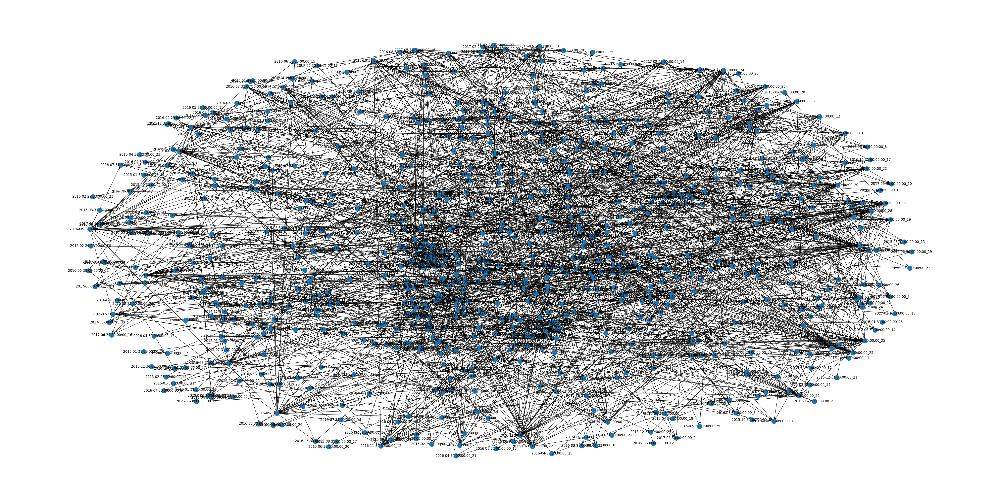

In [70]:
plt.figure(figsize=(50, 25))
nx.draw(lp, with_labels=True)

This graph is not very informative because it's not easylly readable. Nethertheless we can notice that overall the structure stay very similar over time, (i.e strongly connected communities at the center and sparse communities on the periphery) thanks to the timestamp of each node.  

Now let's try to track the community over time using the community matching method provided by the library.

In [71]:
com_jaccard_match = tc.community_matching(method=jaccard)

In [72]:
print(f'type : {type(com_jaccard_match)}; len : {len(com_jaccard_match)}')

type : <class 'list'>; len : 1692


In [73]:
com_jaccard_match[:5]

[('2015-01-31 00:00:00_0', '2015-02-28 00:00:00_0', 0.41497045305318453),
 ('2015-01-31 00:00:00_1', '2015-02-28 00:00:00_2', 0.6034271725826194),
 ('2015-01-31 00:00:00_2', '2015-02-28 00:00:00_3', 0.5473554735547356),
 ('2015-01-31 00:00:00_3', '2015-02-28 00:00:00_1', 0.48510131108462456),
 ('2015-01-31 00:00:00_4', '2015-02-28 00:00:00_4', 0.33533834586466166)]

For a better manipulation we convert this list to a dataframe with the following columns :
- Ti the period of the community Ci
- Ci the community at time Tj
- Tj the period of the community Cb
- Cj the community at time Tj similar to Ci

In [75]:
columns = ['Ti_Ca', 'Tj_Cb', 'score']
df = pd.DataFrame(com_jaccard_match, columns=columns)

#### Some stats plots

In [ ]:
clustering = [tc.get_clustering_at(t.to_timestamp(freq="M")) for t in monthly_graphs.keys()]

<Axes: xlabel='Algorithm', ylabel='size'>

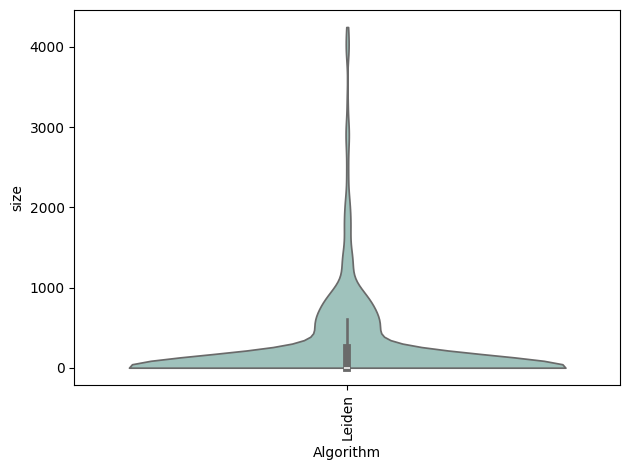

In [ ]:
viz.plot_com_stat(clustering, evaluation.size)

<Axes: xlabel='Algorithm', ylabel='average_internal_degree'>

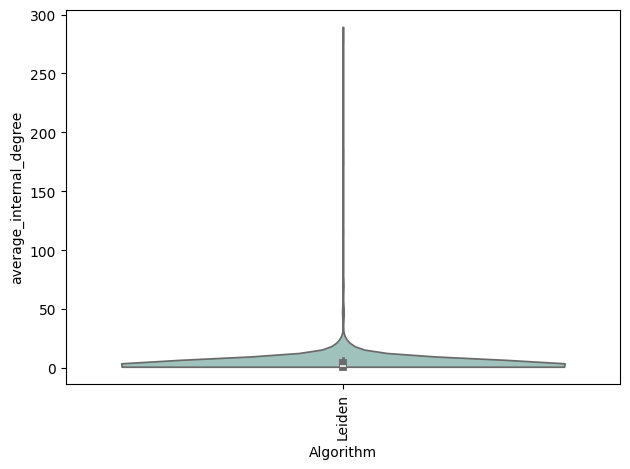

In [ ]:
viz.plot_com_stat(clustering, evaluation.average_internal_degree)

<Axes: xlabel='Algorithm', ylabel='conductance'>

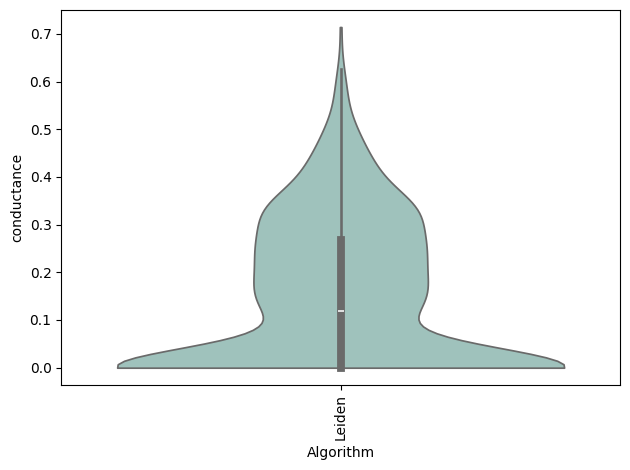

In [ ]:
viz.plot_com_stat(clustering, evaluation.conductance)

<Axes: xlabel='Algorithm', ylabel='max_odf'>

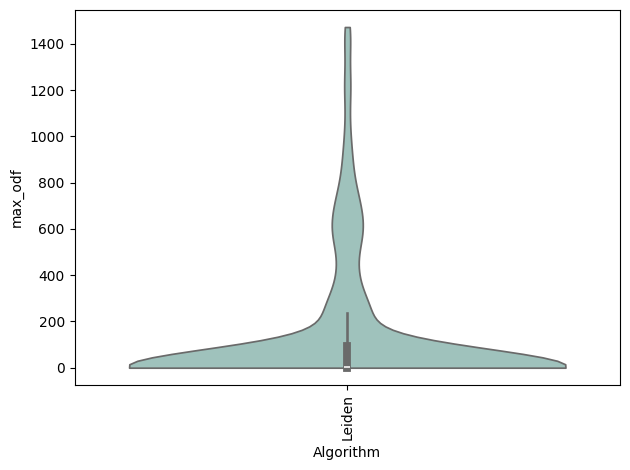

In [ ]:
viz.plot_com_stat(clustering, evaluation.max_odf)

#### Commuities with tiles (temporal trade-off)

In [76]:
import dynetx as dn

In [78]:
com_tiles_save_path = f'{ROOT_DIR}/save/tiles_community.pkl'

##### Compute and save the tiles communities

In [ ]:
dg = dn.DynGraph()

for date, graph in monthly_graphs.items():
  communities = algorithms.leiden(graph)
  dg.add_interactions_from(
        list(graph.edges(data=True)),
        t=int(date.to_timestamp(freq='M').timestamp()))

com_tiles = algorithms.tiles(dg)

In [ ]:
with open(com_tiles_save_path, 'wb') as f:
    pickle.dump(com_tiles, f)

##### Load the tiles communities

In [80]:
with open(com_tiles_save_path, 'rb') as f:
    com_tiles = pickle.load(f)

##### Explore the tiles communities

In [81]:
len(com_tiles.community_matching(method=jaccard))

241

In [82]:
com_tiles.has_explicit_match()

True

In [83]:
len(com_tiles.get_explicit_community_match())

241

This algorithm seems to perform better on our data because it is able to disern community match among each snapshot of the graph.  
Let's then used it to track the community events over time.  

Let's format the data according to our previous definition of classes.  

In [89]:
com_tiles.get_explicit_community_match()

[('1_6', '2_4'),
 ('1_12', '2_4'),
 ('1_23', '2_22'),
 ('1_24', '2_22'),
 ('1_28', '2_26'),
 ('1_31', '2_29'),
 ('1_33', '2_30'),
 ('1_36', '2_35'),
 ('1_37', '2_35'),
 ('1_45', '2_43'),
 ('1_50', '2_49'),
 ('1_53', '2_51'),
 ('1_55', '2_48'),
 ('1_75', '2_73'),
 ('1_82', '2_78'),
 ('1_95', '2_94'),
 ('2_13', '3_4'),
 ('2_39', '3_35'),
 ('2_124', '3_123'),
 ('3_116', '4_112'),
 ('3_125', '4_54'),
 ('4_35', '5_30'),
 ('4_41', '5_40'),
 ('4_44', '5_42'),
 ('4_51', '5_49'),
 ('4_88', '5_87'),
 ('4_101', '5_100'),
 ('5_100', '6_97'),
 ('4_137', '5_80'),
 ('4_164', '5_163'),
 ('5_19', '6_4'),
 ('5_22', '6_21'),
 ('6_21', '7_4'),
 ('5_26', '6_21'),
 ('5_29', '6_21'),
 ('5_78', '6_54'),
 ('5_123', '6_54'),
 ('5_83', '6_76'),
 ('5_86', '6_84'),
 ('5_94', '6_92'),
 ('5_132', '6_127'),
 ('5_184', '6_64'),
 ('6_56', '7_48'),
 ('6_57', '7_48'),
 ('6_147', '7_141'),
 ('6_157', '7_155'),
 ('6_158', '7_153'),
 ('7_42', '8_40'),
 ('7_43', '8_40'),
 ('7_49', '8_48'),
 ('7_62', '8_59'),
 ('7_84', '8_79'

In [110]:
com_tiles.clusterings[0].community

AttributeError: 'NamedClustering' object has no attribute 'community'

In [94]:
# Convert it to a DataFrame
columns = ['start', 'end', 'community_id', 'nodes']
tiles_df = pd.DataFrame(columns=columns)

for idx, community in enumerate(com_tiles.get_explicit_community_match()):
    start, end, nodes = community
    community_data = {'start': start, 'end': end, 'community_id': idx, 'nodes': nodes}
    tiles_df = tiles_df.append(community_data, ignore_index=True)

# Now, tiles_df contains the community information in the desired format
print(tiles_df)

ValueError: not enough values to unpack (expected 3, got 2)

# Temporal graph with Teneto (not used because don't scale)

Teneto is a python library that allow to create temporal graph and compute community detection on it.  
[documentation](https://teneto.readthedocs.io/en/latest/tutorial/networkrepresentation.html)  


In [ ]:
transaction_network_df.sort_values('Date', inplace=True)

In [ ]:
transaction_network_df = transaction_network_df.rename(columns={
    'Source': 'i',
    'Target': 'j',
    'value': 'weight',
    'Date': 't'
})

In [ ]:
def datetime_to_timestamp(date):
  return date.astype(int).div(10**9)

def timestamp_to_datetime(timestamp):
  return pd.to_datetime(timestamp, unit='s')

In [ ]:
transaction_network_df['t'] = (
    transaction_network_df['t'].dt.year * 1e4 +
    transaction_network_df['t'].dt.month * 1e2 +
    transaction_network_df['t'].dt.day
    ).astype(int)

In [ ]:
transaction_network_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5876734 entries, 0 to 5654
Data columns (total 5 columns):
 #   Column           Dtype
---  ------           -----
 0   i                int64
 1   j                int64
 2   weight           int64
 3   nb_transactions  int64
 4   t                int32
dtypes: int32(1), int64(4)
memory usage: 246.6 MB


In [ ]:
tn = TemporalNetwork(
    from_df=transaction_network_df,
    nettype='wd', # weigthed & directed
    timetype='continuous',
    diagonal=True,
    timeunit="jours",
    desc="Temporal graph representation of bitcoin daily transaction from 01/01/2015 to 30/06/2017"
    )

d:\DSC\DMBD\projet\.venv\lib\site-packages\teneto\classes\network.py:242: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.network['i'] = self.network['i'].astype(int)
d:\DSC\DMBD\projet\.venv\lib\site-packages\teneto\classes\network.py:243: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.network['j'] = self.network['j'].astype(int)


MemoryError: Unable to allocate 14.8 TiB for an array with shape (9975, 9975, 20500) and data type float64

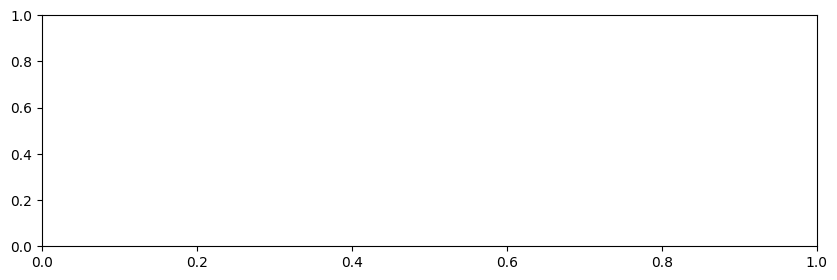

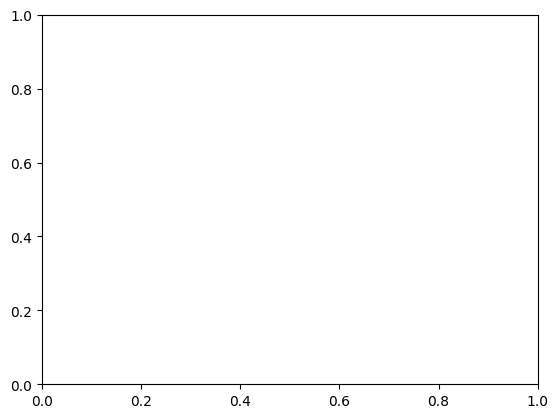

In [ ]:
plt.rcParams['image.cmap'] = 'autumn'

fig,ax = plt.subplots(figsize=(10,3))
tn.plot(plottype="slice_plot")
plt.tight_layout()
plt.show()

In [ ]:
res2 = teneto.communitydetection.temporal_louvain(
    tn, randomseed=RANDOM_SEED,
    consensus_threshold=0.3, # temporal_consensus=False,
    n_iter=5)

In [ ]:
with open(f'{ROOT_DIR}/save/louvain_community.pkl') as f:
    pickle.dump(res2, f)